## Advanced Lane Finding Project

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

---

In [1]:
from tqdm import tqdm
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
from moviepy.editor import VideoFileClip
#from IPython.display import HTML
%matplotlib inline

# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
# no magic numbers: define some constants
# # # # # # # # # # # # # # # # # # # # # # # # # # 
# for calibration
_ROW, _COL, _NUMCHAN = 6, 9, 3
_image_size = (1280, 720)

## First, I'll compute the camera calibration using chessboard images

In [2]:
objp = np.zeros((_ROW*_COL,_NUMCHAN), np.float32)
objp[:,:2] = np.mgrid[0:_COL,0:_ROW].T.reshape(-1,2)

# Credit to http://opencv-python-tutroals.readthedocs.io/en/latest/py_tutorials/py_calib3d/py_calibration/py_calibration.html
# for the idea of refining the image points
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 30, 0.001)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
images = glob.glob('../camera_cal/calibration*.jpg')

flag = True
cal = None

# Step through the list and search for chessboard corners
for fname in tqdm(images):
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray,(_COL,_ROW),None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        
        corners = cv2.cornerSubPix(gray,corners,(11,11),(-1,-1),criteria)
        
        imgpoints.append(corners)
        
        if(flag == True):
            cal = cv2.drawChessboardCorners(img, (_COL,_ROW), corners, ret)
            flag = False
    else:
        print("no corners found for ", fname) #The errors I get are presumably due to mismatching points in images
        
shape = cv2.imread(images[0]).shape[1::-1]

ret, matrix, dist_co, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, shape, None, None)
print("camera matrix C and distortion coefficients retrieved")

  5%|▌         | 1/20 [00:00<00:08,  2.19it/s]

no corners found for  ../camera_cal/calibration1.jpg


 75%|███████▌  | 15/20 [00:06<00:01,  2.75it/s]

no corners found for  ../camera_cal/calibration4.jpg


 80%|████████  | 16/20 [00:07<00:01,  2.56it/s]

no corners found for  ../camera_cal/calibration5.jpg


100%|██████████| 20/20 [00:08<00:00,  2.46it/s]


camera matrix C and distortion coefficients retrieved


## Next I'll correct for image distortion

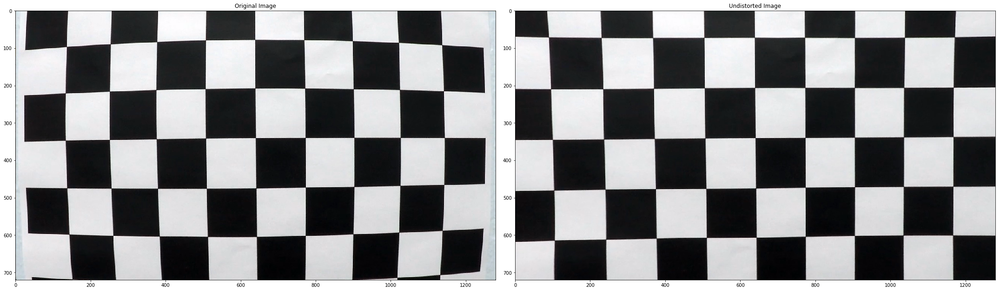

In [3]:
# Note that the camera matrix and distortion coefficients were defined once, which makes this straightforward
def undistort(image):
    return cv2.undistort(image, matrix, dist_co, None, matrix)

# Let's check that it worked
test = cv2.imread('../camera_cal/calibration1.jpg')
undist = undistort(test)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(30,10))
f.tight_layout()
ax1.imshow(test)
ax1.set_title('Original Image')
ax2.imshow(undist)
ax2.set_title('Undistorted Image')

ret = cv2.imwrite('../output_images/calibration.jpg', undist)

Looks good!

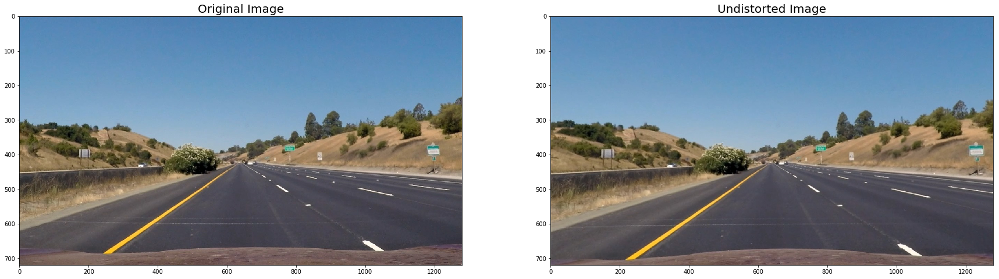

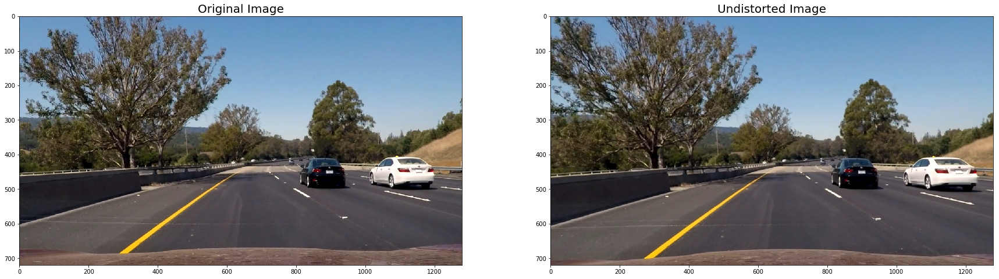

In [4]:
# Let's first take a look at an undistorted image to make sure our calibration was correct and 
# get an idea for some source points to map to.
image = cv2.cvtColor(cv2.imread("../test_images/straight_lines1.jpg"), cv2.COLOR_BGR2RGB)
image2 = cv2.cvtColor(cv2.imread("../test_images/test6.jpg"), cv2.COLOR_BGR2RGB)

undist = undistort(image)
undist2 = undistort(image2)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(30,10))
ax1.set_title('Original Image', fontsize=20)
ax1.imshow(image)

ax2.set_title('Undistorted Image', fontsize=20)
ax2.imshow(undist)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(30,10))
ax1.set_title('Original Image', fontsize=20)
ax1.imshow(image2)

ax2.set_title('Undistorted Image', fontsize=20)
ax2.imshow(undist2)

ret1 = cv2.imwrite('../output_images/undisorted1.jpg', cv2.cvtColor(undist, cv2.COLOR_RGB2BGR))
ret2 = cv2.imwrite('../output_images/undisorted2.jpg', cv2.cvtColor(undist2, cv2.COLOR_RGB2BGR))

Observe how the green sign on the righthand side (at the edge) of the first image is shifted slightly. The white Toyota on the right is also pulled to the right as well, and the tree on the left is also pulled closer. Seems good!

## Compute colour and gradient thresholds...

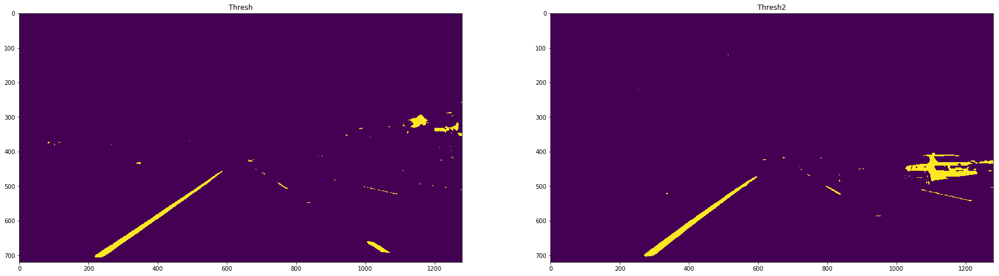

In [5]:
import Threshold

#thresh = Threshold.threshold(undist, do_b=True, do_l=True)
#thresh2 = Threshold.threshold(undist2, do_b=True, do_l=True)

thresh1 = Threshold.final_threshold(undist)
thresh2 = Threshold.final_threshold(undist2)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(30,10))

ax1.set_title('Thresh')
ax1.imshow(thresh1)

ax2.set_title('Thresh2')
ax2.imshow(thresh2)

thresh1 = np.dstack((thresh1*255, thresh1*255, thresh1*255))
thresh2 = np.dstack((thresh2*255, thresh2*255, thresh2*255))

ret = cv2.imwrite('../output_images/thresholded1.jpg', thresh1)
ret = cv2.imwrite('../output_images/thresholded2.jpg', thresh2)

Jazzy! And pretty good actually - lines are still clearly visible.

## Perform a perspective transform

In [6]:
# Hmm, from earlier it seems like (160, 715) and (1120, 715) are our bottom two points, (560, 465) and (730, 465) 
# the upper points.
# How do we map to the rectangle in a perspective transform? Well we know our y-coordinates (min and max of image
# along y-axis), but let's try to find some decent x-coordinates. Let's try going for the quartiles and pad them.
# I tried the quartiles without modification, but I got some seriously weird curvatures. Padding fixes this, not 
# entirely sure why.

x_left = image.shape[1] / 4 + 0
x_right = ((image.shape[1] / 4) * 3) - 0
y_min, y_max = 0, image.shape[0]

points = [[[560, 465]], [[730, 465]], [[1120, 715]], [[160, 715]]]

src = np.float32(points)
dst = np.float32([[x_left, y_min], [x_right, y_min], [x_right, y_max], [x_left, y_max]])
M = cv2.getPerspectiveTransform(src, dst)
Minv = cv2.getPerspectiveTransform(dst, src)

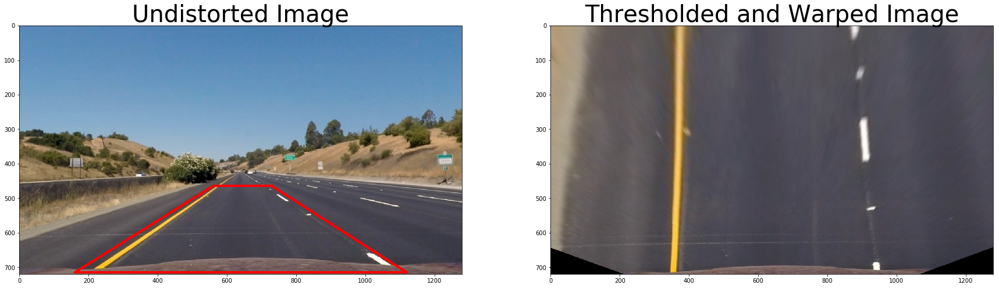

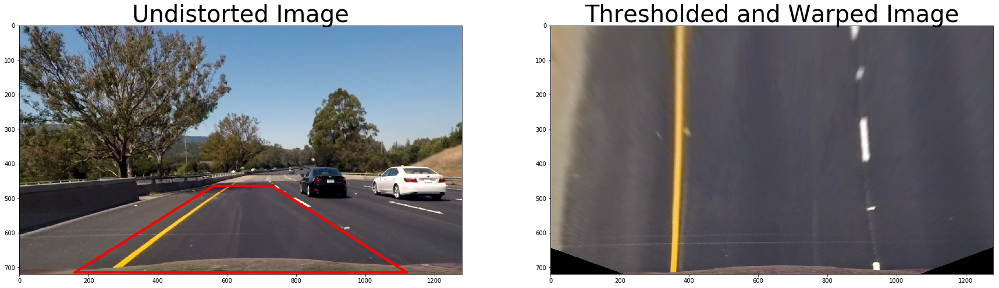

In [7]:
# note that the image needs to be undistorted!
def transform(image):
    return cv2.warpPerspective(image, M, _image_size, flags=cv2.INTER_LINEAR)

bird = transform(undist)
bird2 = transform(undist2)

drawing = True
if(drawing):
    temp_undist = np.copy(undist)
    temp_undist2 = np.copy(undist2)
    temp_bird1 = np.copy(bird)
    temp_bird2 = np.copy(bird)
    temp_bird_thresh = Threshold.final_threshold(bird)
    temp_bird_thresh2 = Threshold.final_threshold(bird2)
    
    pts = np.array([points[3],points[2],points[1],points[0]], np.int32)
    pts = pts.reshape((-1,1,2))
    cv2.polylines(temp_undist,[pts],True,(255,0,0), thickness=5)
    
    pts = np.array([points[3], points[2], points[1], points[0]], np.int32)
    pts = pts.reshape((-1,1,2))
    cv2.polylines(temp_undist2,[pts],True,(255,0,0), thickness=5)

    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(30, 10))
    ax1.imshow(temp_undist)
    ax1.set_title('Undistorted Image', fontsize=40)
    
    ax2.imshow(temp_bird1)
    ax2.set_title('Thresholded and Warped Image', fontsize=40)
    
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(30,10))
    ax1.imshow(temp_undist2)
    ax1.set_title('Undistorted Image', fontsize=40)

    ax2.imshow(temp_bird2)
    ax2.set_title('Thresholded and Warped Image', fontsize=40)
    
    ret = cv2.imwrite('../output_images/warped1.jpg', cv2.cvtColor(temp_bird1, cv2.COLOR_RGB2BGR))
    ret = cv2.imwrite('../output_images/warped2.jpg', cv2.cvtColor(temp_bird2, cv2.COLOR_RGB2BGR))


Pulling the corners in a bit, but that's not bad!

## Extract and display lane lines using convolutions and histogram counts

In [8]:
import collections
import Lane

In [9]:
LEFT = Lane.LEFT
RIGHT = Lane.RIGHT

## Bundle these functions together to perform in sequence against individual images or video input...

In [10]:
# note: these all accept coloured images
# as you can probably guess, these were testing functions (video was being odd with them until I realised
# I had to convert from RGB, which is seriously annoying). process_image is the final one used.

def no_change(image):
    return undistort(image)

def dummy(image):
    undist = undistort(image)
    bird = transform(undist)
    thresh = Threshold.final_threshold(bird)
    img_bin = np.dstack((thresh*255, thresh*255, thresh*255))

    return img_bin

def test_thresh(image):
    undist = undistort(image)
    plt.imshow(undist)
    plt.show()
    thresh = Threshold.final_threshold(undist)
    plt.imshow(thresh)
    plt.show()

def process_image_test_warp(image):
    undist = undistort(image)
    thresh = Threshold.final_threshold(undist)
    bird = transform(thresh)
    return bird
    
def process_image(image):
    undist = undistort(image)
    bird = transform(undist)
    bird_thresh = Threshold.final_threshold(bird) 
    
    display = Lane.video_pipeline(undist, bird_thresh, Minv)

    return display

def display_lines(image):
    undist = undistort(image)
    bird = transform(undist)
    thresh = Threshold.final_threshold(bird) 
    
    display = Lane.display_lines(thresh)
    return display

def get_lines(image):
    undist = undistort(image)
    thresh = Threshold.final_threshold(undist) 
    bird = transform(thresh)
    
    display = Lane.get_lines(bird)

    return display

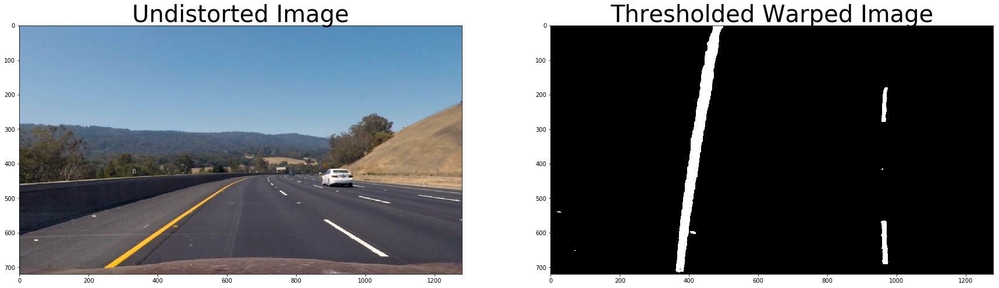

In [11]:
images = glob.glob('../test_images/*.jpg')

image = cv2.cvtColor(cv2.imread(images[4]), cv2.COLOR_BGR2RGB)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(30, 10))
ax1.imshow(undistort(image))
ax1.set_title('Undistorted Image', fontsize=40)

thresh_warp1 = dummy(image)

ax2.imshow(thresh_warp1)
ax2.set_title('Thresholded Warped Image', fontsize=40)

ret = cv2.imwrite('../output_images/thresh_warp1.jpg', thresh_warp1)

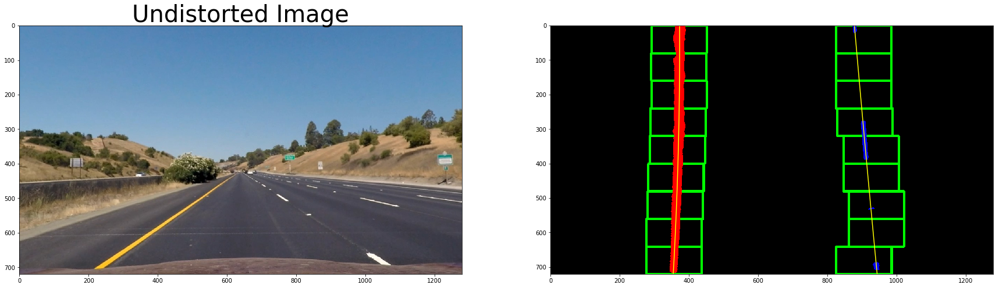

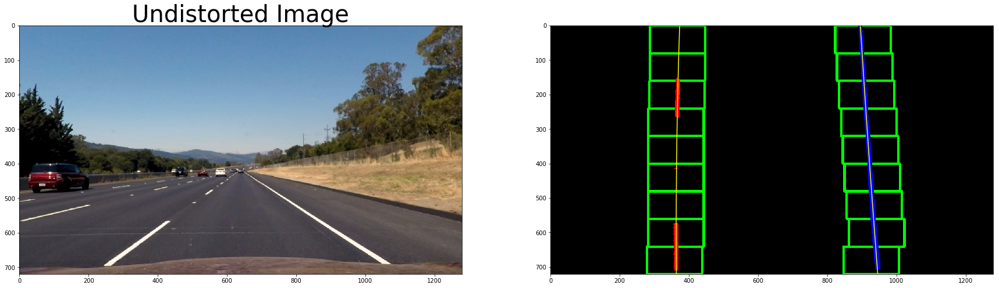

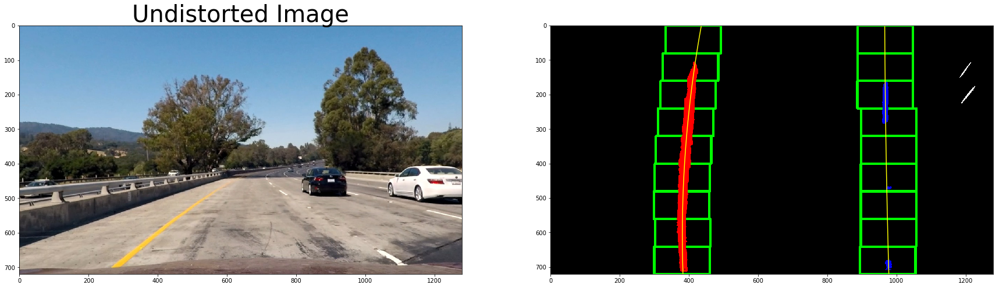

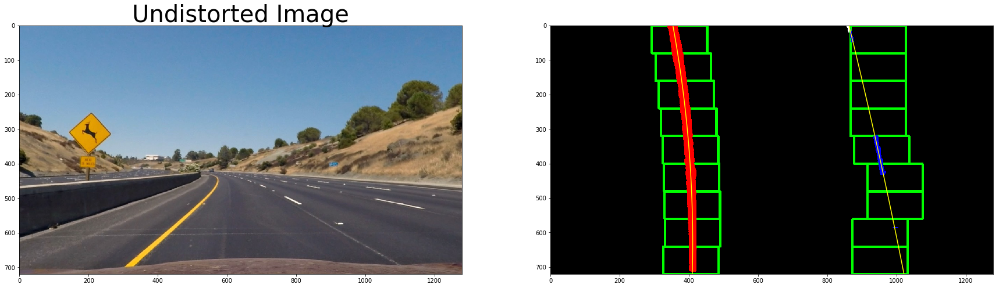

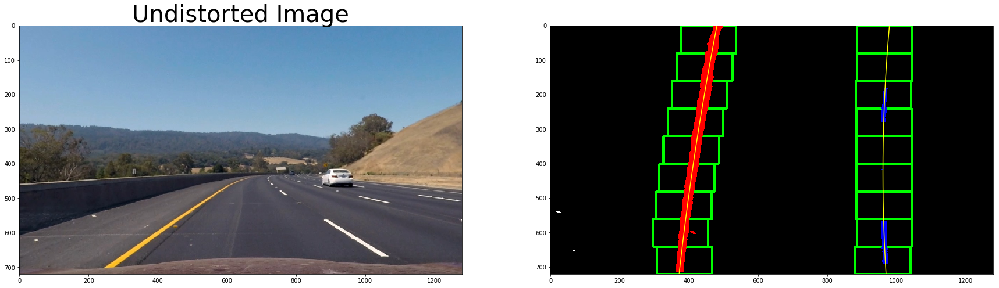

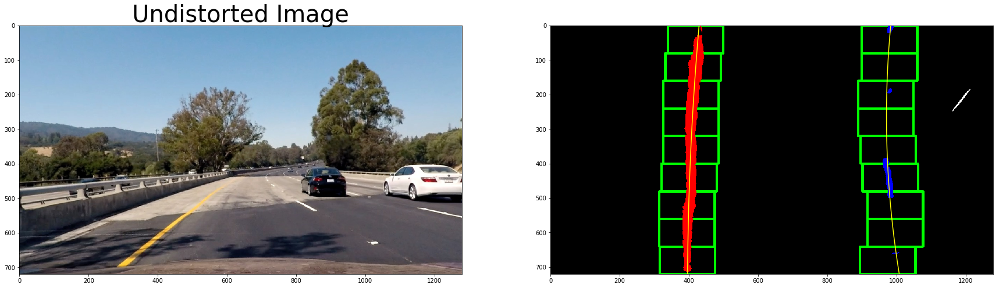

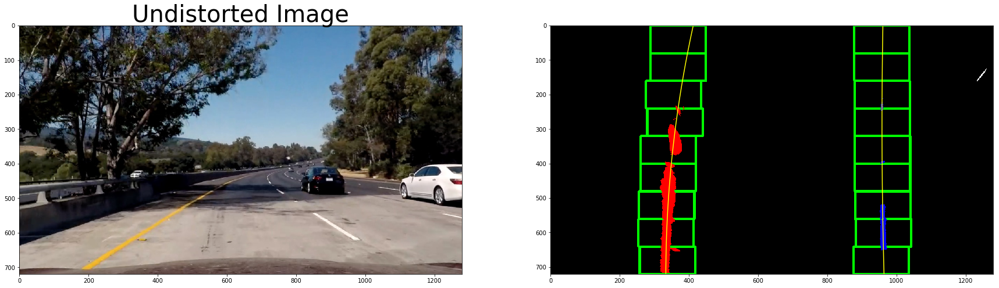

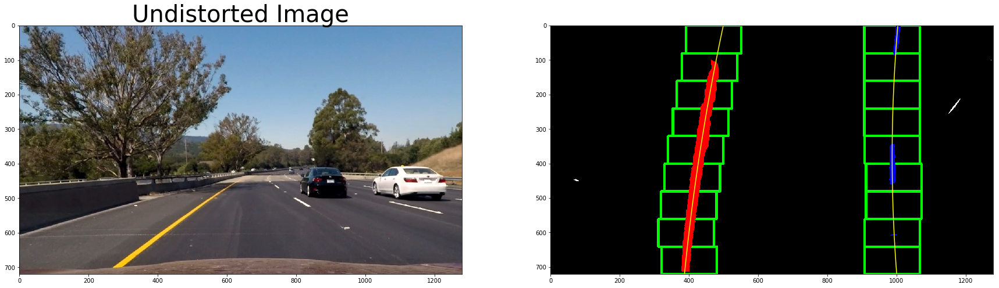

In [12]:
for counter, i in enumerate(images):
    image = cv2.cvtColor(cv2.imread(i), cv2.COLOR_BGR2RGB)
    
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(30, 10))
    ax1.imshow(undistort(image))
    ax1.set_title('Undistorted Image', fontsize=40)

    display = display_lines(image)
    
    ax2.set_title('Searched Lines', fontsize=40)
    ax2.imshow(display)
    
    string = '../output_images/display' + str(counter) + '.jpg'
    
    ret = cv2.imwrite(string, cv2.cvtColor(display, cv2.COLOR_RGB2BGR))

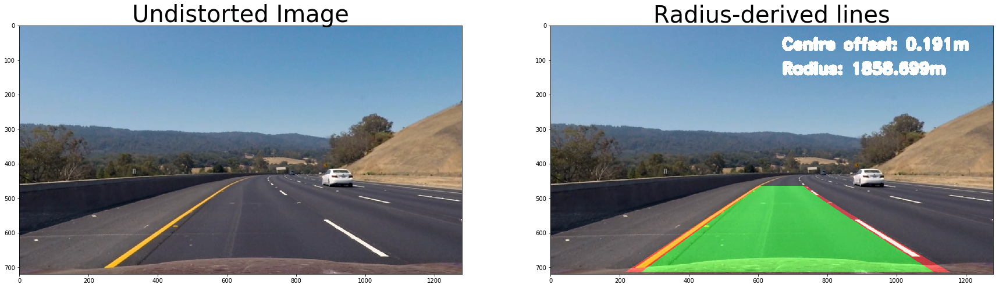

In [13]:
setting = True
if setting:
    image = cv2.cvtColor(cv2.imread(images[4]), cv2.COLOR_BGR2RGB)
    undist = undistort(image)
    bird = process_image_test_warp(image)

    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(30, 10))
    ax1.imshow(undist)
    ax1.set_title('Undistorted Image', fontsize=40)

    result = Lane.get_radius(undist, bird, Minv)

    ax2.imshow(result)
    ax2.set_title('Radius-derived lines', fontsize=40)

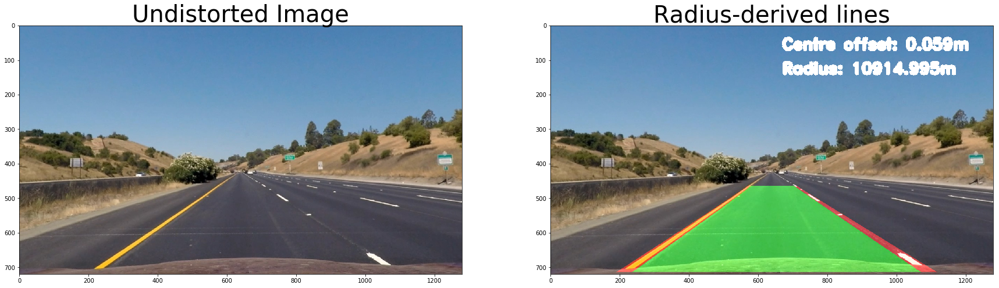

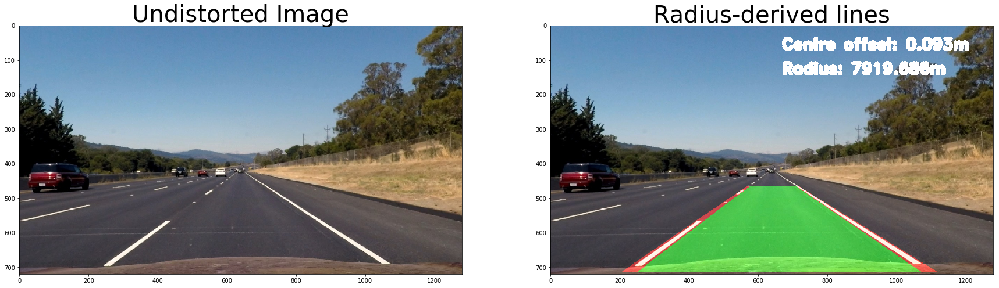

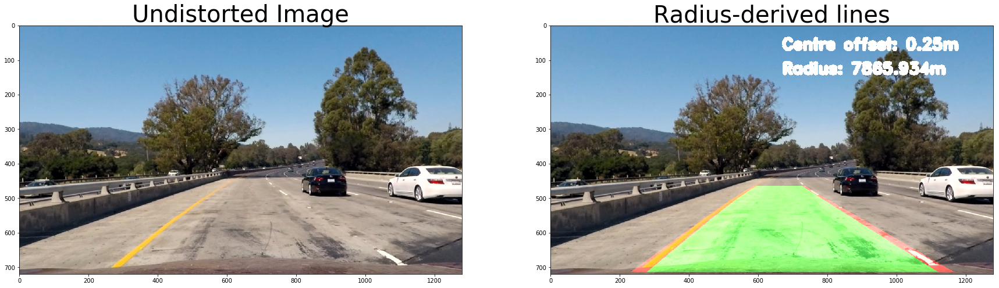

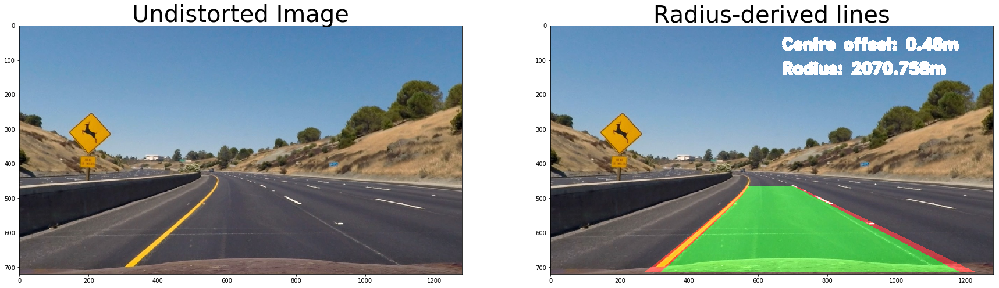

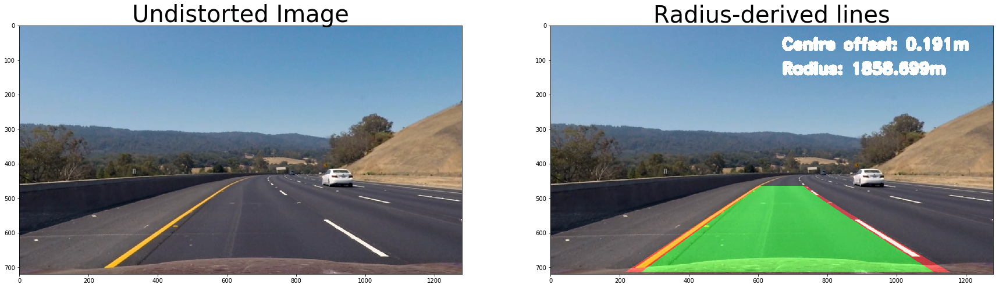

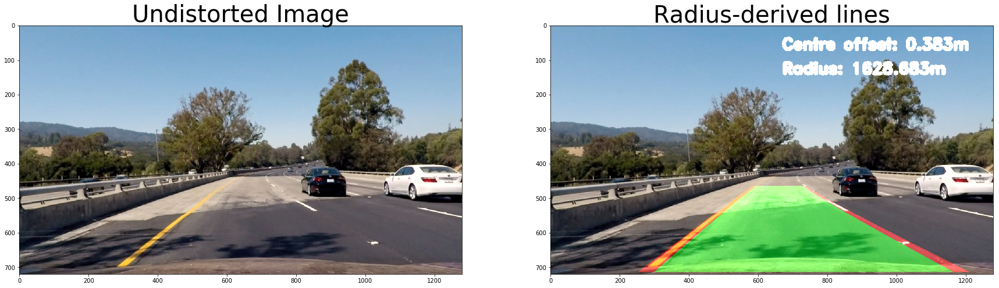

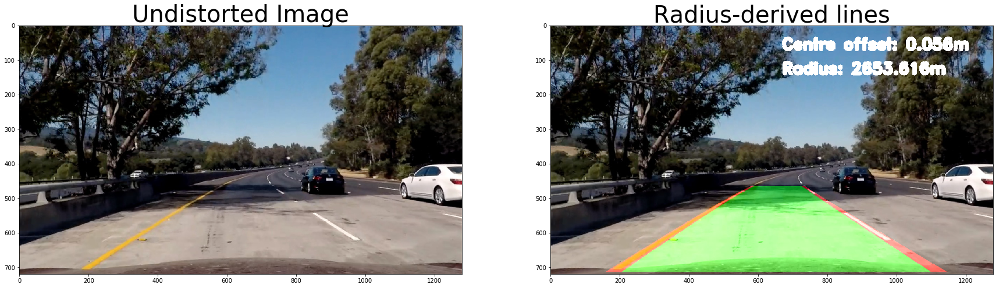

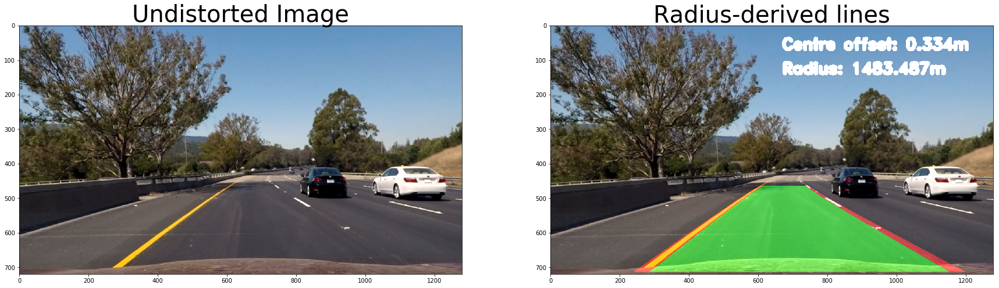

In [14]:
setting = True
if setting:
    for counter, i in enumerate(images):
        image = cv2.cvtColor(cv2.imread(i), cv2.COLOR_BGR2RGB)
        undist = undistort(image)
        bird = process_image_test_warp(image)

        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(30, 10))
        ax1.imshow(undist)
        ax1.set_title('Undistorted Image', fontsize=40)

        result = Lane.get_radius(undist, bird, Minv)

        ax2.imshow(result)
        ax2.set_title('Radius-derived lines', fontsize=40)
        
        ret = cv2.imwrite('../output_images/mapped_region' + str(counter) + '.jpg', cv2.cvtColor(result, cv2.COLOR_RGB2BGR))

In [15]:
Lane.LEFT.reset()
Lane.RIGHT.reset()

## Video processing, etc.
output = '../output_video/output_video.mp4'

clip1 = VideoFileClip("../videos/project_video.mp4")
video_clip = clip1.fl_image(process_image) #NOTE: this function expects color images!
%time video_clip.write_videofile(output, audio=False)

[MoviePy] >>>> Building video ../output_video/output_video.mp4
[MoviePy] Writing video ../output_video/output_video.mp4


100%|█████████▉| 1260/1261 [03:55<00:00,  5.62it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: ../output_video/output_video.mp4 

CPU times: user 4min 31s, sys: 31.4 s, total: 5min 2s
Wall time: 3min 57s


In [16]:
# HTML("""
# <video width="960" height="540" controls>
#   <source src="{0}">
# </video>
# """.format(output))

## Et voilà, some detected lanes and one "vafer" thin mint